In [1]:
import numpy as np
import pandas as pd
pd.set_option('float_format', '{:.2f}'.format)
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import datetime

In [2]:
# Set the data directory
DATADIR = "C:\Soumen\AIML\MSc\StockProject\datasets\stock_price"
EXTN = "csv"

In [3]:
stock_list = pd.read_csv(DATADIR+'\\final_stock_list.csv', index_col='Unnamed: 0')

In [4]:
stock_list

,Company Name,Industry,Symbol,Series,ISIN Code,MCAP Class,MCAP,Yahoo Symbol
0,Reliance Industries Ltd.,OIL & GAS,RELIANCE,EQ,INE002A01018,largecap,14238890328064.00,RELIANCE.NS
1,Tata Consultancy Services Ltd.,IT,TCS,EQ,INE467B01029,largecap,11884493275136.00,TCS.NS
2,HDFC Bank Ltd.,FINANCIAL SERVICES,HDFCBANK,EQ,INE040A01034,largecap,7969851834368.00,HDFCBANK.NS
3,Infosys Ltd.,IT,INFY,EQ,INE009A01021,largecap,6777336758272.00,INFY.NS
4,Hindustan Unilever Ltd.,CONSUMER GOODS,HINDUNILVR,EQ,INE030A01027,largecap,5540568629248.00,HINDUNILVR.NS
5,Steel Authority of India Ltd.,METALS,SAIL,EQ,INE114A01011,midcap,522513580032.00,SAIL.NS
6,SRF Ltd.,CHEMICALS,SRF,EQ,INE647A01010,midcap,468149633024.00,SRF.NS
7,Balkrishna Industries Ltd.,AUTOMOBILE,BALKRISIND,EQ,INE787D01026,midcap,451018227712.00,BALKRISIND.NS
8,MindTree Ltd.,IT,MINDTREE,EQ,INE018I01017,midcap,448268763136.00,MINDTREE.NS
9,Bharat Electronics Ltd.,INDUSTRIAL MANUFACTURING,BEL,EQ,INE263A01024,midcap,445043179520.00,BEL.NS


In [5]:
# Create the list of companies
companies = [stock for stock in stock_list.Symbol]

# Add NIFTY to the list
companies.append('NIFTY')

# Dynamically create Data frames
for eachCompany in companies:
    vars()[eachCompany] = pd.DataFrame(pd.read_csv(DATADIR+'\\'+eachCompany+'.csv'))

In [6]:
companies

['RELIANCE',
 'TCS',
 'HDFCBANK',
 'INFY',
 'HINDUNILVR',
 'SAIL',
 'SRF',
 'BALKRISIND',
 'MINDTREE',
 'BEL',
 'ALKYLAMINE',
 'HAPPSTMNDS',
 'APLAPOLLO',
 'CAMS',
 'KAJARIACER',
 'NIFTY']

In [7]:
# List all loaded data frames
%whos DataFrame

Variable     Type         Data/Info
-----------------------------------
ALKYLAMINE   DataFrame                Date   Open  <...>\n[2426 rows x 7 columns]
APLAPOLLO    DataFrame                Date   Open  <...>\n[1977 rows x 7 columns]
BALKRISIND   DataFrame                Date   Open  <...>\n[2460 rows x 7 columns]
BEL          DataFrame                Date   Open  <...>\n[2460 rows x 7 columns]
CAMS         DataFrame               Date    Open  <...>n\n[203 rows x 7 columns]
HAPPSTMNDS   DataFrame               Date    Open  <...>n\n[214 rows x 7 columns]
HDFCBANK     DataFrame                Date    Open <...>\n[2460 rows x 7 columns]
HINDUNILVR   DataFrame                Date    Open <...>\n[2460 rows x 7 columns]
INFY         DataFrame                Date   Open  <...>\n[2460 rows x 7 columns]
KAJARIACER   DataFrame                Date   Open  <...>\n[2460 rows x 7 columns]
MINDTREE     DataFrame                Date   Open  <...>\n[2460 rows x 7 columns]
NIFTY        DataFrame    

In [8]:
CAMS[['Date', 'Close']]

,Date,Close
0,2020-10-05,1401.40
1,2020-10-06,1419.40
2,2020-10-07,1381.45
3,2020-10-08,1334.90
4,2020-10-09,1336.80
...,...,...
198,2021-07-23,3310.30
199,2021-07-26,3194.50
200,2021-07-27,3226.65
201,2021-07-28,3169.30


In [9]:
# pd.merge(RELIANCE[['Date', 'Close']], CAMS[['Date', 'Close']], how = 'left',  on='Date').iloc[:, -1:]
pd.merge(RELIANCE[['Date', 'Close']], CAMS[['Date', 'Close']], how = 'left',  on='Date')

,Date,Close_x,Close_y
0,2010-01-04,532.70,NaN
1,2010-01-05,530.32,NaN
2,2010-01-06,538.89,NaN
3,2010-01-07,547.83,NaN
4,2010-01-08,546.40,NaN
...,...,...,...
2455,2019-12-23,1556.64,NaN
2456,2019-12-24,1531.93,NaN
2457,2019-12-26,1501.17,NaN
2458,2019-12-27,1527.87,NaN


In [10]:
companies

['RELIANCE',
 'TCS',
 'HDFCBANK',
 'INFY',
 'HINDUNILVR',
 'SAIL',
 'SRF',
 'BALKRISIND',
 'MINDTREE',
 'BEL',
 'ALKYLAMINE',
 'HAPPSTMNDS',
 'APLAPOLLO',
 'CAMS',
 'KAJARIACER',
 'NIFTY']

In [11]:
stock_data = pd.DataFrame()

for company in companies:
    if len(stock_data)==0:
#         stock_data[['Date', company + '_Close']] = vars()[company][['Date','Close']]
        stock_data[['Date', company]] = vars()[company][['Date','Close']]
    else:
#         stock_data[company + '_Close'] = pd.merge(stock_data, vars()[company][['Date','Close']],how = 'left', on='Date').iloc[:, -1:]
        stock_data[company] = pd.merge(stock_data, vars()[company][['Date','Close']],how = 'left', on='Date').iloc[:, -1:]

In [12]:
# Fix date
def fix_date(df):
    df['Date'] = pd.to_datetime(df['Date'])
    df.set_index('Date',inplace=True) # Set the Date column as the index
    df = df.sort_values(['Date'])

In [13]:
fix_date(stock_data)

In [14]:
stock_data.head()

,RELIANCE,TCS,HDFCBANK,INFY,HINDUNILVR,SAIL,SRF,BALKRISIND,MINDTREE,BEL,ALKYLAMINE,HAPPSTMNDS,APLAPOLLO,CAMS,KAJARIACER,NIFTY
Date,,,,,,,,,,,,,,,,
2010-01-04,532.70,375.83,170.57,326.58,264.70,247.60,212.00,54.92,172.32,59.03,14.70,NaN,NaN,NaN,27.00,5232.20
2010-01-05,530.32,375.92,170.72,327.67,263.85,254.55,214.50,56.00,167.56,59.21,14.13,NaN,NaN,NaN,27.12,5277.90
2010-01-06,538.89,367.42,170.84,322.89,265.35,248.35,213.70,54.01,172.24,58.81,14.80,NaN,NaN,NaN,26.83,5281.80
2010-01-07,547.83,357.20,171.28,315.63,264.80,241.60,212.80,54.15,168.80,58.48,14.49,NaN,NaN,NaN,27.10,5263.10
2010-01-08,546.40,349.90,171.51,308.02,265.95,238.85,213.35,54.19,169.21,58.52,15.11,NaN,NaN,NaN,26.70,5244.75


In [15]:
import datetime as dt
import pandas as pd
import math
import plotly.express as px

def stock_summ(df):
    stock_summary = pd.DataFrame()
    stock_summary['Stock'] = df.columns
    for stock in stock_summary['Stock']:
        stock_summary.loc[stock_summary['Stock']== stock, 'From'] = df[df[stock].notna()][stock].index.min()
        stock_summary.loc[stock_summary['Stock']== stock, 'To'] = df[df[stock].notna()][stock].index.max()
        stock_summary.loc[stock_summary['Stock']== stock, 'Data points'] = df[stock].count()
    
    # Plot summary
    fig = px.timeline(stock_summary, x_start="From", x_end="To", y="Stock", color="Stock", text="Data points")
    fig.update_layout(title='Stock Data Summary',
                      xaxis=dict(title='Date Range',
                                 tickfont_size=12),
                      yaxis=dict(title='Stock name',
                                 titlefont_size=14,
                                 tickfont_size=12),
                      xaxis_rangeslider_visible=False,
                      width=1000,height=600, margin=dict(l=100, r=50, b=100, t=100, pad=4),
                      template='none')
    fig.show()

In [16]:
stock_summ(stock_data)

## Data Cleaning

In [17]:
# It is important to drop weekends as the Indian stock market does not normally trade on weekends.
stock_data[(stock_data.index.dayofweek==5)&(stock_data.index.dayofweek==6)] 

,RELIANCE,TCS,HDFCBANK,INFY,HINDUNILVR,SAIL,SRF,BALKRISIND,MINDTREE,BEL,ALKYLAMINE,HAPPSTMNDS,APLAPOLLO,CAMS,KAJARIACER,NIFTY
Date,,,,,,,,,,,,,,,,


In [18]:
# Check for missing values, data types etc
stock_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2460 entries, 2010-01-04 to 2019-12-30
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   RELIANCE    2460 non-null   float64
 1   TCS         2460 non-null   float64
 2   HDFCBANK    2460 non-null   float64
 3   INFY        2460 non-null   float64
 4   HINDUNILVR  2460 non-null   float64
 5   SAIL        2460 non-null   float64
 6   SRF         2460 non-null   float64
 7   BALKRISIND  2460 non-null   float64
 8   MINDTREE    2460 non-null   float64
 9   BEL         2460 non-null   float64
 10  ALKYLAMINE  2426 non-null   float64
 11  HAPPSTMNDS  0 non-null      float64
 12  APLAPOLLO   1977 non-null   float64
 13  CAMS        0 non-null      float64
 14  KAJARIACER  2460 non-null   float64
 15  NIFTY       2442 non-null   float64
dtypes: float64(16)
memory usage: 326.7 KB


In [19]:
def check_null(df):
    # Check for null values in the dataframe
    for column in df:
        if df[column].isnull().any():
           print('Feature: "{0}" has {1} or {2:.2f}% null values'.format(column, 
                                                                         df[column].isnull().sum(), 
                                                                         df[column].isnull().mean()*100))

In [20]:
check_null(stock_data)

Feature: "ALKYLAMINE" has 34 or 1.38% null values
Feature: "HAPPSTMNDS" has 2460 or 100.00% null values
Feature: "APLAPOLLO" has 483 or 19.63% null values
Feature: "CAMS" has 2460 or 100.00% null values
Feature: "NIFTY" has 18 or 0.73% null values


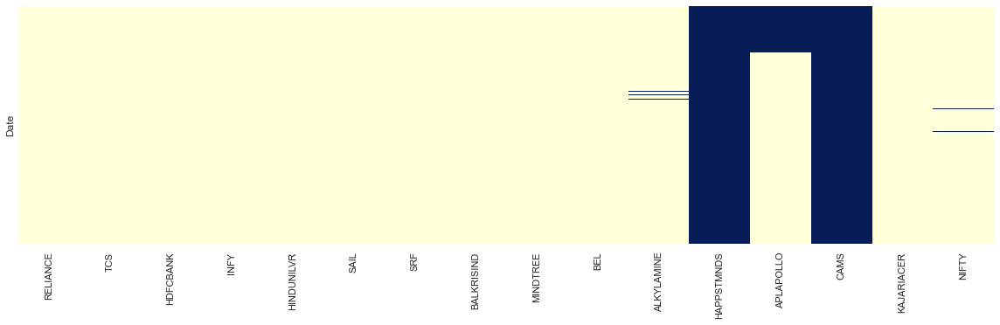

In [21]:
f, ax = plt.subplots(figsize=(20, 5))
sns.heatmap(stock_data.isnull(), ax=ax, yticklabels=False, cbar=False, cmap='YlGnBu')
plt.show()

In [22]:
def display_null(df):
    # Display the number of NAN values
    nan_columns = []
    nan_values = []

    for column in df.columns:
        nan_columns.append(column)
        nan_values.append(df[column].isnull().sum())

    fig, ax = plt.subplots(figsize=(16,8))
    plt.barh(nan_columns, nan_values, color='#86bf91')
    plt.show()

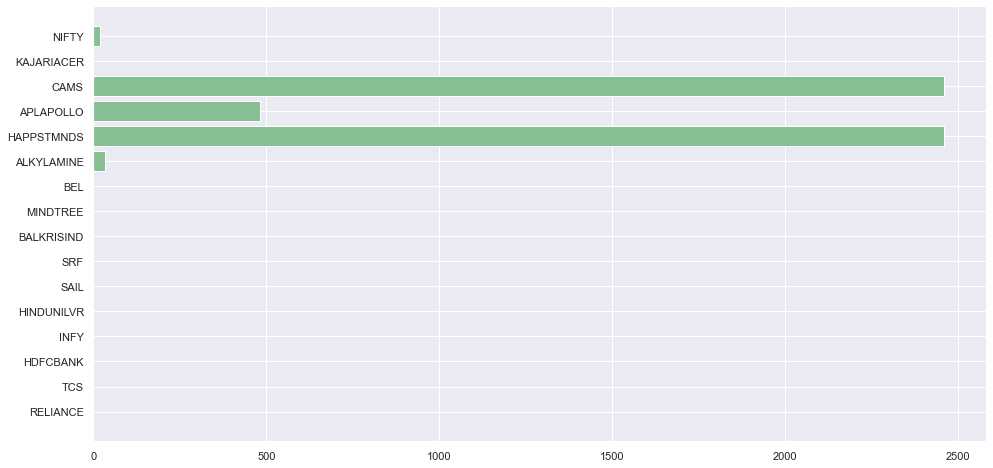

In [23]:
display_null(stock_data)

In [24]:
NIFTY[NIFTY['Adj Close'].isna() == True]

NIFTY[NIFTY['Date'] == '2010-01-04']

,Date,Open,High,Low,Close,Adj Close,Volume
0,2010-01-04,5200.90,5238.45,5167.10,5232.20,5232.20,0


In [25]:
stock_data.loc[:,'NIFTY'][stock_data.loc[:,'NIFTY'].isna() == True]

Date
2011-05-31   NaN
2011-07-14   NaN
2011-11-24   NaN
2011-12-26   NaN
2012-01-02   NaN
2012-05-21   NaN
2012-08-28   NaN
2013-01-01   NaN
2014-01-01   NaN
2014-02-17   NaN
2014-04-24   NaN
2014-10-15   NaN
2015-01-01   NaN
2015-04-15   NaN
2016-01-01   NaN
2016-08-12   NaN
2018-01-01   NaN
2019-01-01   NaN
Name: NIFTY, dtype: float64

In [26]:
# stock_data.dropna(axis='columns', inplace=True)

In [27]:
############################################################################
# User defined function : remove_null - Drop rows/columns with null values #
############################################################################

def remove_null(dataFrame, axis=1, percent=100):
    '''
    Usage: Drop rows/columns with null values based on the following:
            dataFrame: Original data frame
            axis: 0 = rows, 1 = columns ( 1 is default)
            percent: % null values in rows/columns (100 is default)
    '''
    
    df = dataFrame.copy()
    o_shape = df.shape
    
    if axis == 1:
        pct_null_col = df.isnull().mean()*100
        missing_col = pct_null_col[pct_null_col >= percent].index
        df.drop(missing_col, axis=1, inplace = True)
        print('\nDropped', len(missing_col), 'columns having >=', percent, '% null values')
    
    else:
        pct_null_row = df.transpose().isnull().mean()*100 
        missing_row = pct_null_row[pct_null_row >= percent].index
        df.drop(df.index[missing_row], axis=0, inplace=True)
        print('\nDropped', len(missing_row), 'rows having >=', percent, '% null values')
    
    print("\n\tOld dataset: (Rows, Columns) -",o_shape,"\n\tNew dataset: (Rows, Columns) -",df.shape)

    return df

In [28]:
# Drop columns having >= 10 % null values
stock_data = remove_null(stock_data,1,10)


Dropped 3 columns having >= 10 % null values

	Old dataset: (Rows, Columns) - (2460, 16) 
	New dataset: (Rows, Columns) - (2460, 13)


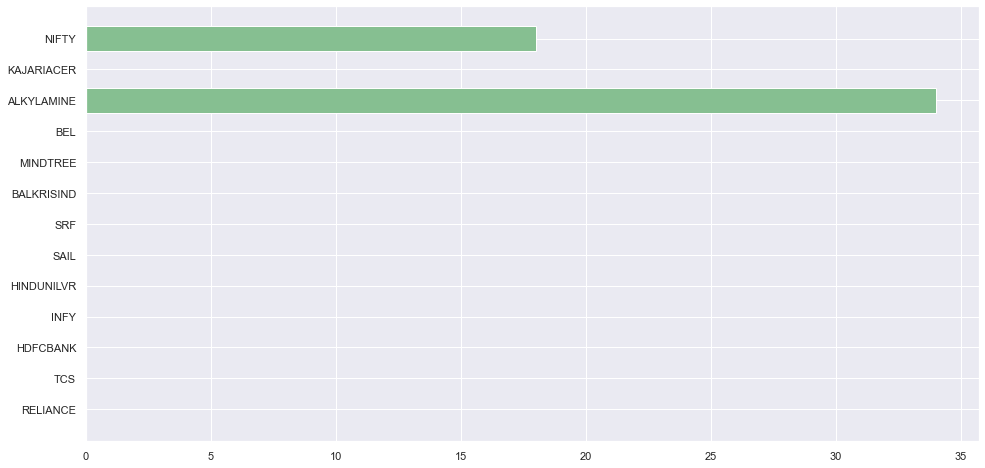

In [29]:
display_null(stock_data)

# 2.3 Second, for the remaining columns with at most 10% missing observation, the missing values are fillied using linear interpolation.

In [30]:
stock_data = stock_data.astype(float).interpolate(method ='linear',axis = 0,limit=30, limit_direction ='forward')

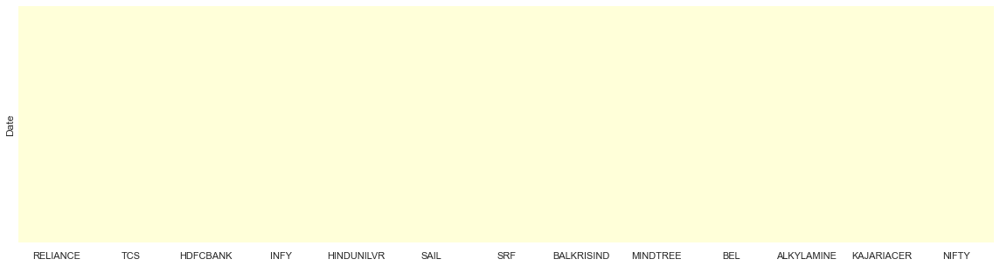

In [31]:
f, ax = plt.subplots(figsize=(20, 5))
sns.heatmap(stock_data.isnull(), ax=ax, yticklabels=False, cbar=False, cmap='YlGnBu')
plt.show()

In [32]:
# import plotly.graph_objects as go
# fig = go.Figure()

import plotly.express as px

def plot_all(df):
    y_col = list(df.columns)
    fig=px.line(df, x=df.index, y=y_col, title='Stock')
    fig.update_yaxes(title_text='Price')
    fig.show()


In [33]:
plot_all(stock_data)

#### Correlation of Adj closing price using heat map.

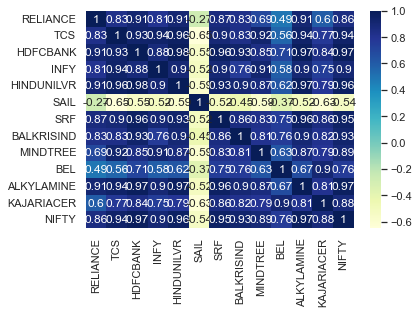

In [34]:
# print(stock_data.corr())
sns.heatmap(stock_data.corr(), cmap="YlGnBu", annot=True)
plt.show()

In [35]:
returns = stock_data.pct_change(1)
mean_daily_returns = returns.mean()
volatilities = returns.std()

### Correlation of daily returns using heat map.

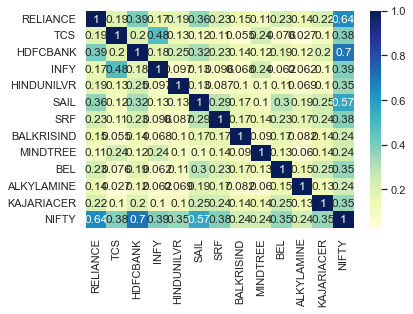

In [36]:
# print(returns.corr())
sns.heatmap(returns.corr(), cmap="YlGnBu", annot=True)
plt.show()

In [37]:
volatilities

RELIANCE     0.02
TCS          0.02
HDFCBANK     0.01
INFY         0.02
HINDUNILVR   0.01
SAIL         0.02
SRF          0.02
BALKRISIND   0.02
MINDTREE     0.02
BEL          0.02
ALKYLAMINE   0.03
KAJARIACER   0.02
NIFTY        0.01
dtype: float64

In [38]:
mean_daily_returns * len(stock_data.index)

RELIANCE      1.39
TCS           2.06
HDFCBANK      2.23
INFY          1.17
HINDUNILVR    2.25
SAIL         -1.01
SRF           3.44
BALKRISIND    3.44
MINDTREE      2.03
BEL           1.02
ALKYLAMINE    4.29
KAJARIACER    3.40
NIFTY         0.97
dtype: float64

In [39]:
volatilities * len(stock_data.index)

RELIANCE     40.48
TCS          38.72
HDFCBANK     32.54
INFY         41.57
HINDUNILVR   35.95
SAIL         60.17
SRF          57.60
BALKRISIND   51.71
MINDTREE     49.28
BEL          49.63
ALKYLAMINE   67.42
KAJARIACER   47.19
NIFTY        23.79
dtype: float64

In [40]:
combine = pd.DataFrame({'Returns': mean_daily_returns * len(stock_data.index),
                       'Volatility': volatilities * len(stock_data.index)})

In [41]:
combine

,Returns,Volatility
RELIANCE,1.39,40.48
TCS,2.06,38.72
HDFCBANK,2.23,32.54
INFY,1.17,41.57
HINDUNILVR,2.25,35.95
SAIL,-1.01,60.17
SRF,3.44,57.60
BALKRISIND,3.44,51.71
MINDTREE,2.03,49.28
BEL,1.02,49.63


In [42]:
combine.shape[0]

13

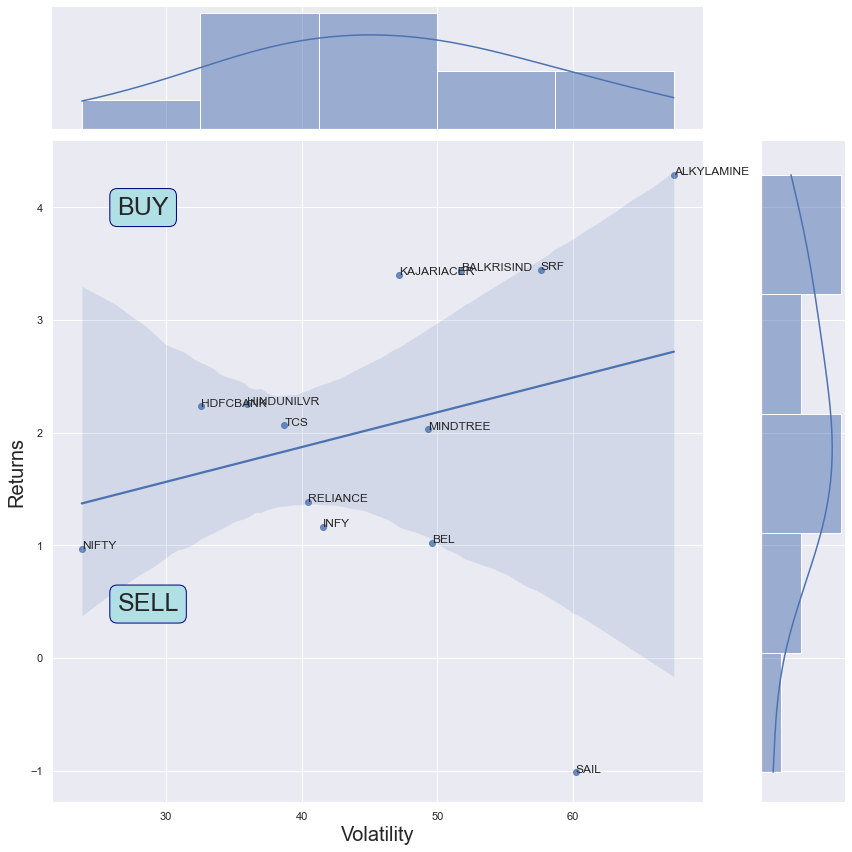

In [43]:
sns.set_style('darkgrid')

g = sns.jointplot(x="Volatility", y="Returns", data=combine, kind="reg", height=12)

for i in range(combine.shape[0]):
    g.ax_joint.annotate(combine.index[i], (combine.iloc[i, 1], combine.iloc[i, 0]))

g.ax_joint.annotate(f'BUY', xy=(0.1, .9), xycoords='axes fraction', fontsize=25,
                    ha='left', va='center',
                    bbox={'boxstyle': 'round', 'fc': 'powderblue', 'ec': 'navy'})

g.ax_joint.annotate(f'SELL', xy=(0.1, .3), xycoords='axes fraction', fontsize=25,
                    ha='left', va='center',
                    bbox={'boxstyle': 'round', 'fc': 'powderblue', 'ec': 'navy'})

g.set_axis_labels(xlabel='Volatility', ylabel='Returns', size=20)

plt.tight_layout()
plt.show()

#### Normalize and compare

In [44]:
stock_data

,RELIANCE,TCS,HDFCBANK,INFY,HINDUNILVR,SAIL,SRF,BALKRISIND,MINDTREE,BEL,ALKYLAMINE,KAJARIACER,NIFTY
Date,,,,,,,,,,,,,
2010-01-04,532.70,375.83,170.57,326.58,264.70,247.60,212.00,54.92,172.32,59.03,14.70,27.00,5232.20
2010-01-05,530.32,375.92,170.72,327.67,263.85,254.55,214.50,56.00,167.56,59.21,14.13,27.12,5277.90
2010-01-06,538.89,367.42,170.84,322.89,265.35,248.35,213.70,54.01,172.24,58.81,14.80,26.83,5281.80
2010-01-07,547.83,357.20,171.28,315.63,264.80,241.60,212.80,54.15,168.80,58.48,14.49,27.10,5263.10
2010-01-08,546.40,349.90,171.51,308.02,265.95,238.85,213.35,54.19,169.21,58.52,15.11,26.70,5244.75
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-23,1556.64,2231.70,1302.40,736.00,1950.40,41.00,3357.20,951.10,777.65,98.85,427.02,504.20,12262.75
2019-12-24,1531.93,2215.60,1289.15,733.40,1946.40,41.00,3329.45,954.80,775.80,99.60,416.68,511.10,12214.55
2019-12-26,1501.17,2201.95,1270.45,728.95,1944.95,42.40,3413.60,961.30,792.45,98.85,421.86,515.20,12126.55


In [45]:
stock_data/stock_data.iloc[0]

,RELIANCE,TCS,HDFCBANK,INFY,HINDUNILVR,SAIL,SRF,BALKRISIND,MINDTREE,BEL,ALKYLAMINE,KAJARIACER,NIFTY
Date,,,,,,,,,,,,,
2010-01-04,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
2010-01-05,1.00,1.00,1.00,1.00,1.00,1.03,1.01,1.02,0.97,1.00,0.96,1.00,1.01
2010-01-06,1.01,0.98,1.00,0.99,1.00,1.00,1.01,0.98,1.00,1.00,1.01,0.99,1.01
2010-01-07,1.03,0.95,1.00,0.97,1.00,0.98,1.00,0.99,0.98,0.99,0.99,1.00,1.01
2010-01-08,1.03,0.93,1.01,0.94,1.00,0.96,1.01,0.99,0.98,0.99,1.03,0.99,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-23,2.92,5.94,7.64,2.25,7.37,0.17,15.84,17.32,4.51,1.67,29.05,18.67,2.34
2019-12-24,2.88,5.90,7.56,2.25,7.35,0.17,15.70,17.39,4.50,1.69,28.35,18.93,2.33
2019-12-26,2.82,5.86,7.45,2.23,7.35,0.17,16.10,17.50,4.60,1.67,28.70,19.08,2.32


## Return

In [46]:
plot_all(stock_data/stock_data.iloc[0])

In [47]:
(stock_data.iloc[-1]/stock_data.iloc[0])**(1/10) - 1

RELIANCE      0.11
TCS           0.19
HDFCBANK      0.22
INFY          0.08
HINDUNILVR    0.22
SAIL         -0.16
SRF           0.32
BALKRISIND    0.34
MINDTREE      0.17
BEL           0.05
ALKYLAMINE    0.40
KAJARIACER    0.34
NIFTY         0.09
dtype: float64

In [48]:
stock_data

,RELIANCE,TCS,HDFCBANK,INFY,HINDUNILVR,SAIL,SRF,BALKRISIND,MINDTREE,BEL,ALKYLAMINE,KAJARIACER,NIFTY
Date,,,,,,,,,,,,,
2010-01-04,532.70,375.83,170.57,326.58,264.70,247.60,212.00,54.92,172.32,59.03,14.70,27.00,5232.20
2010-01-05,530.32,375.92,170.72,327.67,263.85,254.55,214.50,56.00,167.56,59.21,14.13,27.12,5277.90
2010-01-06,538.89,367.42,170.84,322.89,265.35,248.35,213.70,54.01,172.24,58.81,14.80,26.83,5281.80
2010-01-07,547.83,357.20,171.28,315.63,264.80,241.60,212.80,54.15,168.80,58.48,14.49,27.10,5263.10
2010-01-08,546.40,349.90,171.51,308.02,265.95,238.85,213.35,54.19,169.21,58.52,15.11,26.70,5244.75
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-23,1556.64,2231.70,1302.40,736.00,1950.40,41.00,3357.20,951.10,777.65,98.85,427.02,504.20,12262.75
2019-12-24,1531.93,2215.60,1289.15,733.40,1946.40,41.00,3329.45,954.80,775.80,99.60,416.68,511.10,12214.55
2019-12-26,1501.17,2201.95,1270.45,728.95,1944.95,42.40,3413.60,961.30,792.45,98.85,421.86,515.20,12126.55


## Sharpe ratio

The Sharpe Ratio weighs the returns of an investment against it's volatility

Sharpe Ratio = $(r_i - r_f) / \sigma_i $

$r_i = $ Annual return of investment <br>
$r_f = $ Annual risk free return <br>
$\sigma_i = $ Annual volatility of investment <br>

In [49]:
def sharpe_ratio(df, rfr):
    consolidated_data = pd.DataFrame(columns=[df.columns], 
                                     index=['CAGR','Risk Free Rate (%)', 'Annualized Volatility', 'Sharpe Ratio'])
    ret = pd.DataFrame()
    for stock in df.columns:
        ret[stock] = df[stock].pct_change()
        consolidated_data.loc['CAGR',stock] = ((df[stock][-1] / df[stock][0]) ** (1/round(len(df)/252)) - 1)
        consolidated_data.loc['Risk Free Rate (%)',stock] = rfr
        consolidated_data.loc['Annualized Volatility',stock] = ret[stock].std()*np.sqrt(252)
        consolidated_data.loc['Sharpe Ratio',stock] = (consolidated_data.loc['CAGR',stock] - consolidated_data.loc['Risk Free Rate (%)',stock]/100) / consolidated_data.loc['Annualized Volatility',stock]

    return(consolidated_data) 

In [50]:
consolidated_data = sharpe_ratio(stock_data,4)

In [51]:
consolidated_data

,RELIANCE,TCS,HDFCBANK,INFY,HINDUNILVR,SAIL,SRF,BALKRISIND,MINDTREE,BEL,ALKYLAMINE,KAJARIACER,NIFTY
CAGR,0.11,0.19,0.22,0.08,0.22,-0.16,0.32,0.34,0.17,0.05,0.40,0.34,0.09
Risk Free Rate (%),4,4,4,4,4,4,4,4,4,4,4,4,4
Annualized Volatility,0.26,0.25,0.21,0.27,0.23,0.39,0.37,0.33,0.32,0.32,0.44,0.30,0.15
Sharpe Ratio,0.27,0.61,0.87,0.16,0.78,-0.52,0.75,0.89,0.40,0.04,0.83,0.99,0.32


In [52]:
w = 0.2
x = list(stock_data.columns)
CAGR = consolidated_data.loc['CAGR',].values
Annualized_Volatility = consolidated_data.loc['Annualized Volatility',].values
Sharpe_Ratio = consolidated_data.loc['Sharpe Ratio',].values

bar1 = np.arange(len(x))
bar2 = [i+w for i in bar1]
bar3 = [i+w for i in bar2] 

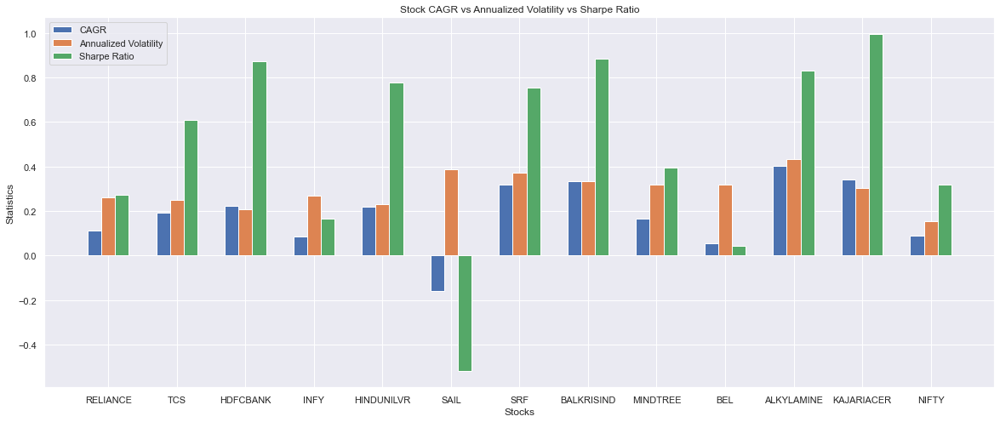

In [53]:
plt.rcParams['figure.figsize'] = (20,8)
plt.bar(bar1,CAGR,w,label='CAGR')
plt.bar(bar2,Annualized_Volatility,w,label='Annualized Volatility')
plt.bar(bar3,Sharpe_Ratio,w,label='Sharpe Ratio')

plt.xlabel('Stocks')
plt.ylabel('Statistics')
plt.title('Stock CAGR vs Annualized Volatility vs Sharpe Ratio')
plt.xticks(bar1+w,x)
plt.legend()
plt.show()

# Volatility
- Different ways to look at it
- Here we will use: Average True Range (ATR)


### What is Volatility?
- Volatility has a number of different meanings
- We use it in relation to price movement
- Can be thought as the equivalent as risk

### Resourses
- Volatility https://www.investopedia.com/terms/v/volatility.asp
- Average True Range https://www.investopedia.com/terms/a/atr.asp\n

In [54]:
 def atr(data):
    if 'Date' in data.columns:
        fix_date(data)
    
    high_low = data['High'] - data['Low']
    high_cp = np.abs(data['High'] - data['Close'].shift())
    low_cp = np.abs(data['Low'] - data['Close'].shift())
    df = pd.concat([high_low, high_cp, low_cp], axis=1)
    true_range = np.max(df, axis=1)

    average_true_range = true_range.rolling(14).mean()
    true_range.rolling(14).sum()/14


    plt.rcParams['figure.figsize'] = (20,8)
    plt.rcParams['axes.grid'] = True
    plt.rc('xtick', labelsize=16) 
    plt.rc('ytick', labelsize=16) 
    plt.rc('legend',fontsize=16)
    fig, ax = plt.subplots()
    average_true_range.plot(ax=ax, color='blue')
    ax2 = data['Close'].plot(ax=ax, secondary_y=True, alpha=.5, color='red')
    ax.set_ylabel("ATR", fontsize=18)
    ax2.set_ylabel("Price", fontsize=18)

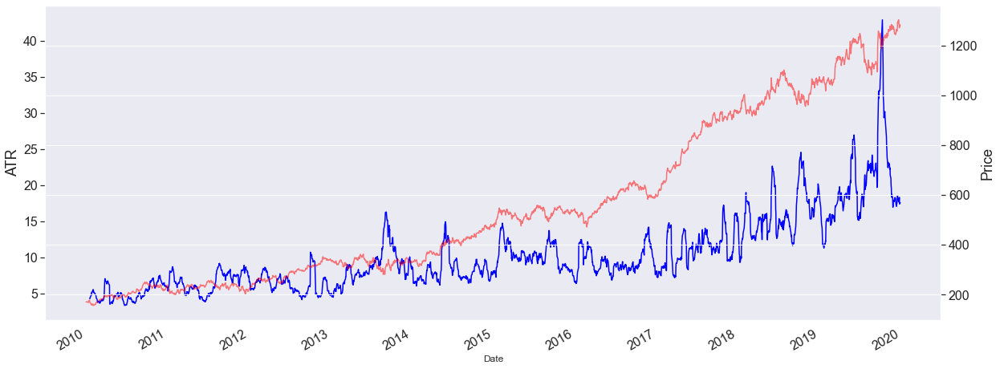

In [55]:
atr(HDFCBANK)

In [56]:
stock_data

,RELIANCE,TCS,HDFCBANK,INFY,HINDUNILVR,SAIL,SRF,BALKRISIND,MINDTREE,BEL,ALKYLAMINE,KAJARIACER,NIFTY
Date,,,,,,,,,,,,,
2010-01-04,532.70,375.83,170.57,326.58,264.70,247.60,212.00,54.92,172.32,59.03,14.70,27.00,5232.20
2010-01-05,530.32,375.92,170.72,327.67,263.85,254.55,214.50,56.00,167.56,59.21,14.13,27.12,5277.90
2010-01-06,538.89,367.42,170.84,322.89,265.35,248.35,213.70,54.01,172.24,58.81,14.80,26.83,5281.80
2010-01-07,547.83,357.20,171.28,315.63,264.80,241.60,212.80,54.15,168.80,58.48,14.49,27.10,5263.10
2010-01-08,546.40,349.90,171.51,308.02,265.95,238.85,213.35,54.19,169.21,58.52,15.11,26.70,5244.75
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-23,1556.64,2231.70,1302.40,736.00,1950.40,41.00,3357.20,951.10,777.65,98.85,427.02,504.20,12262.75
2019-12-24,1531.93,2215.60,1289.15,733.40,1946.40,41.00,3329.45,954.80,775.80,99.60,416.68,511.10,12214.55
2019-12-26,1501.17,2201.95,1270.45,728.95,1944.95,42.40,3413.60,961.30,792.45,98.85,421.86,515.20,12126.55


In [57]:
def plot_returns(data):
    plt.style.use('seaborn-bright')
    # Plot all the close prices
    ((data.pct_change()+1).cumprod()).plot(figsize=(20, 12))

    # Show the legend
    plt.legend()

    # Define the label for the title of the figure
    plt.title("Returns", fontsize=24)

    # Define the labels for x-axis and y-axis
    plt.ylabel('Cumulative Returns', fontsize=20)
    plt.xlabel('Year', fontsize=20)

    # Plot the grid lines
#     plt.grid(which="major", color='k', linestyle='-.', linewidth=0.5)
    plt.show()

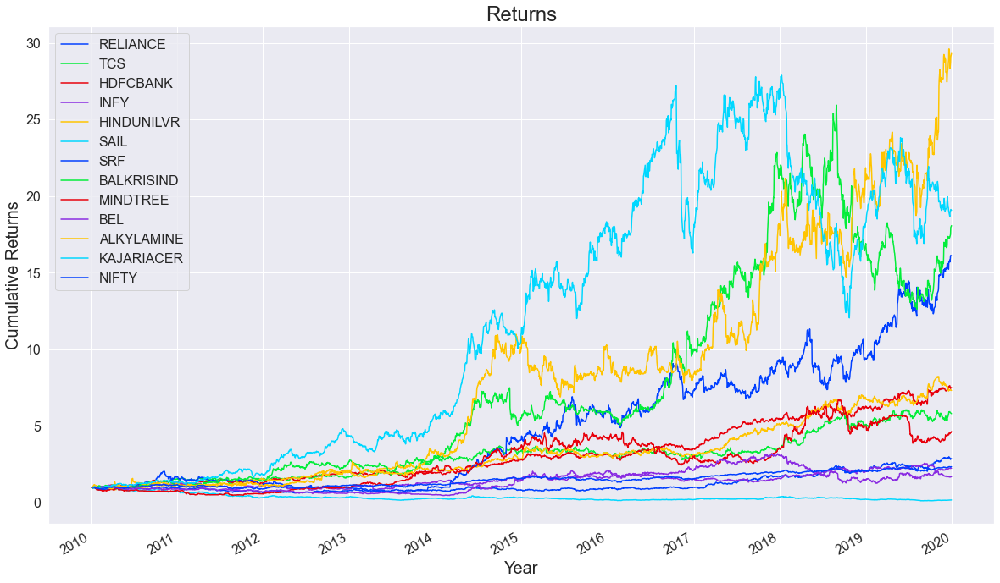

In [58]:
plot_returns(stock_data)